# AirBnb Price Prediction- ML and Explainable AI (LIME and SHAP)



## I. PROJECT INTRODUCTION

### 1.	Name of the project

AirBnb Price Prediction- ML and Explainable AI (LIME and SHAP)

### 2.	Name: - Ashutosh Singh





## II. PROBLEM UNDERSTANDING

### 1.	Business Problem

As more people choose Airbnb as their primary accommodation provider, Airbnb has effectively challenged the traditional hotel business. Since its establishment in 2008, Airbnb has experienced tremendous development, with the number of rentals listed on its website increasing at an exponential rate each year. We'll utilize the Airbnb dataset to identify significant trends in customer interest and predict the price and rating of various destinations. We can then provide solutions to business difficulties.

### 2.	Questions

What can we learn about different hosts and areas?
How to predict the price for listings using listing descriptions?
What can we learn from predictions?
Can we find out how many feature that affected the price?
Can we uncover trends in reviews of Airbnb visitors to different locations?



## III. DATA UNDERSTANDING

### 1.	Data Source

The Inside Airbnb dataset contains approximately 1.2 million listings from various countries across the world. It also has 84 distinct listing characteristics.

In this project, we use the dataset of US listings and European listings in The Inside Airbnb. It contains over 800,000 listings and 27 useful features.

### 2.	Number of observations

821,335

### 3.	Number of features, meaning of features (data dictionary)

27

### 4.	Data Dictionary (Meaning of featureS)

In [41]:
######### Data Dictionary #########

# There are 27 columns in this dataset and their description are as follows.

# accommodates: The maximum capacity of the listing

# amenities: 

# availability_365: The availability of the listing 365 days in the future as determined by the calendar. Note a listing may not be available because it has been booked by a guest or blocked by the host.

# bedrooms: The number of bedrooms.

# beds: The number of bed(s)

# calculated_host_listings_count: The number of listings the host has in the current scrape, in the city/region geography.

# host_has_profile_pic: boolean [t=true; f=false]

# host_id: Airbnb's unique identifier for the host/user

# host_identity_verified: boolean [t=true; f=false]

# host_name: Name of the host. Usually just the first name(s).

# host_response_rate: 

# host_response_time: 

# id: Airbnb's unique identifier for the listing

# instant_bookable: [t=true; f=false]. Whether the guest can automatically book the listing without the host requiring to accept their booking request. An indicator of a commercial listing.

# last_review: The date of the last/newest review

# latitude: Uses the World Geodetic System (WGS84) projection for latitude and longitude.

# longitude: Uses the World Geodetic System (WGS84) projection for latitude and longitude.

# maximum_nights: maximum number of night stay for the listing (calendar rules may be different).

# minimum_nights: minimum number of night stay for the listing (calendar rules may be different).

# name: Name of the listing.

# neighbourhood: 

# number_of_reviews: The number of reviews the listing has

# property_type: Self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field

# reviews_per_month: The number of reviews the listing has over the lifetime of the listing

# review_scores_rating: average rating

# room_type: [ Entire home/apt | Private room | Shared room | Hotel ]

######### Target Variable #########
#
# price
#

## IV. DATA COLLECTION



### 1.	Import libraries

In [318]:
# Data Collection, Data Cleaning & Data Manipulation
!pip install xgboost
import numpy as np
import pandas as pd
from sklearn import datasets

# Data Visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# Data Transformation
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from scipy import stats

# Models Building
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

## Classification Problems
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

## Regression Problems
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Explainbale AI (XAI)
!pip install lime
import lime.lime_tabular
!pip install shap
import shap

# Unsupervised Learning: Clustering
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, Birch, MeanShift, SpectralClustering
from sklearn.metrics import adjusted_rand_score

# Others
# ...

In [320]:
import pandas as pd
import os

# Assuming your downloaded files are in a folder named 'data'
data_folder = './data/'  # Set the path where the CSV files are located

# Get the list of all CSV files in the folder
listing_files = [file for file in os.listdir(data_folder) if file.endswith('.csv.gz')]

# Initialize an empty dataframe
input_df = pd.DataFrame()

# Load each file and append to the input_df
for file_name in listing_files:
    file_path = os.path.join(data_folder, file_name)
    
    # Load the file
    city_df = pd.read_csv(file_path, compression='gzip')
    
    # Append the data to the main dataframe
    input_df = pd.concat([input_df, city_df], ignore_index=True)

# The input_df now contains data from all the downloaded CSV files
print("Combined DataFrame Shape:", input_df.shape)


Combined DataFrame Shape: (10085, 75)


### 2.	Import data

In [301]:
# listing_links = '''http://data.insideairbnb.com/austria/vienna/vienna/2021-11-07/data/listings.csv.gz
# http://data.insideairbnb.com/belgium/bru/brussels/2021-10-23/data/listings.csv.gz
# http://data.insideairbnb.com/belgium/vlg/antwerp/2021-10-28/data/listings.csv.gz
# http://data.insideairbnb.com/belgium/vlg/ghent/2021-10-26/data/listings.csv.gz
# http://data.insideairbnb.com/czech-republic/prague/prague/2021-10-22/data/listings.csv.gz
# http://data.insideairbnb.com/denmark/hovedstaden/copenhagen/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/france/auvergne-rhone-alpes/lyon/2021-10-14/data/listings.csv.gz
# http://data.insideairbnb.com/france/ile-de-france/paris/2021-10-09/data/listings.csv.gz
# http://data.insideairbnb.com/france/nouvelle-aquitaine/bordeaux/2021-10-14/data/listings.csv.gz
# http://data.insideairbnb.com/germany/be/berlin/2021-10-21/data/listings.csv.gz
# http://data.insideairbnb.com/germany/bv/munich/2021-10-26/data/listings.csv.gz
# http://data.insideairbnb.com/greece/attica/athens/2021-10-25/data/listings.csv.gz
# http://data.insideairbnb.com/greece/central-macedonia/thessaloniki/2021-10-25/data/listings.csv.gz
# http://data.insideairbnb.com/greece/crete/crete/2021-10-28/data/listings.csv.gz
# http://data.insideairbnb.com/greece/south-aegean/south-aegean/2021-10-22/data/listings.csv.gz
# http://data.insideairbnb.com/ireland/2021-10-21/data/listings.csv.gz
# http://data.insideairbnb.com/ireland/leinster/dublin/2021-11-07/data/listings.csv.gz
# http://data.insideairbnb.com/italy/campania/naples/2021-10-19/data/listings.csv.gz
# http://data.insideairbnb.com/italy/emilia-romagna/bologna/2021-10-19/data/listings.csv.gz
# http://data.insideairbnb.com/italy/lazio/rome/2021-10-11/data/listings.csv.gz
# http://data.insideairbnb.com/italy/lombardia/bergamo/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/italy/lombardy/milan/2021-10-18/data/listings.csv.gz
# http://data.insideairbnb.com/italy/puglia/puglia/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/italy/sicilia/sicily/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/italy/toscana/florence/2021-10-19/data/listings.csv.gz
# http://data.insideairbnb.com/italy/trentino-alto-adige-s%C3%BCdtirol/trentino/2021-10-30/data/listings.csv.gz
# http://data.insideairbnb.com/italy/veneto/venice/2021-11-04/data/listings.csv.gz
# http://data.insideairbnb.com/latvia/riga/riga/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/malta/2021-10-28/data/listings.csv.gz
# http://data.insideairbnb.com/norway/oslo/oslo/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/portugal/lisbon/lisbon/2021-10-15/data/listings.csv.gz
# http://data.insideairbnb.com/portugal/norte/porto/2021-10-15/data/listings.csv.gz
# http://data.insideairbnb.com/spain/andaluc%C3%ADa/malaga/2021-10-30/data/listings.csv.gz
# http://data.insideairbnb.com/spain/andaluc%C3%ADa/sevilla/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/spain/catalonia/barcelona/2021-10-10/data/listings.csv.gz
# http://data.insideairbnb.com/spain/catalonia/girona/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/spain/comunidad-de-madrid/madrid/2021-11-07/data/listings.csv.gz
# http://data.insideairbnb.com/spain/islas-baleares/mallorca/2021-10-14/data/listings.csv.gz
# http://data.insideairbnb.com/spain/islas-baleares/menorca/2021-10-30/data/listings.csv.gz
# http://data.insideairbnb.com/spain/pv/euskadi/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/spain/vc/valencia/2021-10-21/data/listings.csv.gz
# http://data.insideairbnb.com/sweden/stockholms-l%C3%A4n/stockholm/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/switzerland/geneva/geneva/2021-10-28/data/listings.csv.gz
# http://data.insideairbnb.com/switzerland/vd/vaud/2021-11-04/data/listings.csv.gz
# http://data.insideairbnb.com/switzerland/z%C3%BCrich/zurich/2021-10-28/data/listings.csv.gz
# http://data.insideairbnb.com/the-netherlands/north-holland/amsterdam/2021-11-04/data/listings.csv.gz
# http://data.insideairbnb.com/united-kingdom/england/bristol/2021-10-25/data/listings.csv.gz
# http://data.insideairbnb.com/united-kingdom/england/greater-manchester/2021-10-24/data/listings.csv.gz
# http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/data/listings.csv.gz
# http://data.insideairbnb.com/united-kingdom/scotland/edinburgh/2021-10-15/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/nc/asheville/2021-10-18/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/tx/austin/2021-10-14/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ma/boston/2021-10-19/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/fl/broward-county/2021-10-25/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ma/cambridge/2021-10-28/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/il/chicago/2021-10-18/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/nv/clark-county-nv/2021-10-21/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/oh/columbus/2021-10-25/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/co/denver/2021-10-29/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/hi/hawaii/2021-10-11/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/nj/jersey-city/2021-10-23/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/los-angeles/2021-10-09/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/tn/nashville/2021-10-21/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/la/new-orleans/2021-10-09/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ny/new-york-city/2021-10-06/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/oakland/2021-10-23/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/pacific-grove/2021-10-30/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/or/portland/2021-10-22/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ri/rhode-island/2021-10-30/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/or/salem-or/2021-10-24/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/san-diego/2021-10-23/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/san-francisco/2021-10-06/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/san-mateo-county/2021-10-24/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/santa-clara-county/2021-10-24/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/ca/santa-cruz-county/2021-10-30/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/wa/seattle/2021-10-23/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/mn/twin-cities-msa/2021-10-22/data/listings.csv.gz
# http://data.insideairbnb.com/united-states/dc/washington-dc/2021-10-18/data/listings.csv.gz'''

In [303]:
# listing_links = listing_links.split('\n')

In [305]:
# input_df = pd.DataFrame()

In [322]:
# for link in listing_links:
#     city_df = pd.read_csv(filepath_or_buffer = link, header = 0)
#     input_df = input_df.append(city_df)

In [324]:
input_df = input_df.reset_index(drop = True)

In [326]:
features = '''accommodates
amenities
availability_365
bedrooms
beds
calculated_host_listings_count
host_has_profile_pic
host_id
host_identity_verified
host_name
host_response_rate
host_response_time
id
instant_bookable
last_review
latitude
longitude
maximum_nights
minimum_nights
name
neighbourhood
number_of_reviews
price
property_type
review_scores_rating
reviews_per_month
room_type'''
features = sorted(features.split("\n"))
for i in range(len(features)):
  print(i, features[i])

0 accommodates
1 amenities
2 availability_365
3 bedrooms
4 beds
5 calculated_host_listings_count
6 host_has_profile_pic
7 host_id
8 host_identity_verified
9 host_name
10 host_response_rate
11 host_response_time
12 id
13 instant_bookable
14 last_review
15 latitude
16 longitude
17 maximum_nights
18 minimum_nights
19 name
20 neighbourhood
21 number_of_reviews
22 price
23 property_type
24 review_scores_rating
25 reviews_per_month
26 room_type


In [328]:
my_df = pd.DataFrame()
for feature in features:
  my_df[feature] = input_df[feature]

### 3.	View the data



#### a.	Check Shape (rows, columns)

In [332]:
my_df.shape

(10085, 27)

#### b.	Check Head

In [335]:
display(my_df.head())

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_name,...,maximum_nights,minimum_nights,name,neighbourhood,number_of_reviews,price,property_type,review_scores_rating,reviews_per_month,room_type
0,4,"[""TV with standard cable"", ""Air conditioning"",...",158,2.0,2.0,1,t,4621559,f,Kenneth,...,1125,28,Luxury 2 bedroom apartment,NaN,9,$70.00,Entire rental unit,3.56,0.07,Entire home/apt
1,2,"[""Iron"", ""Shampoo"", ""Cooking basics"", ""Free dr...",336,1.0,1.0,4,t,19648678,t,Terra,...,1125,2,Restored Precinct in Center Sq. w/Parking,Neighborhood highlights,305,$116.00,Entire rental unit,4.75,2.49,Entire home/apt
2,2,"[""Backyard"", ""Iron"", ""Shampoo"", ""Cooking basic...",34,0.0,1.0,2,t,29288920,t,Gregg,...,45,2,Large studio apt by Capital Center & ESP@,Neighborhood highlights,366,$75.00,Entire rental unit,4.51,3.22,Entire home/apt
3,2,"[""Iron"", ""Shampoo"", ""Cooking basics"", ""Kitchen...",279,1.0,1.0,4,t,19648678,t,Terra,...,1125,2,Center Sq. Loft in Converted Precinct w/ Parking,Neighborhood highlights,328,$116.00,Entire rental unit,4.73,2.91,Entire home/apt
4,6,"[""Pocket wifi"", ""Smart lock"", ""Iron"", ""Shampoo...",362,3.0,3.0,2,t,42430824,t,John M,...,1125,2,Entire Beautiful French Victorian 1884,Neighborhood highlights,56,$305.00,Entire home,4.75,0.51,Entire home/apt


#### c.	Check Columns & Types

In [338]:
my_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10085 entries, 0 to 10084
Data columns (total 27 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   accommodates                    10085 non-null  int64  
 1   amenities                       10085 non-null  object 
 2   availability_365                10085 non-null  int64  
 3   bedrooms                        9806 non-null   float64
 4   beds                            6241 non-null   float64
 5   calculated_host_listings_count  10085 non-null  int64  
 6   host_has_profile_pic            10085 non-null  object 
 7   host_id                         10085 non-null  int64  
 8   host_identity_verified          10085 non-null  object 
 9   host_name                       10085 non-null  object 
 10  host_response_rate              6890 non-null   object 
 11  host_response_time              6890 non-null   object 
 12  id                              

#### d. Check Stats

In [341]:
my_df.describe()

,accommodates,availability_365,bedrooms,beds,calculated_host_listings_count,host_id,id,latitude,longitude,maximum_nights,minimum_nights,number_of_reviews,review_scores_rating,reviews_per_month
count,10085.000000,10085.000000,9806.000000,6241.000000,10085.000000,1.008500e+04,1.008500e+04,10085.000000,10085.000000,10085.000000,10085.000000,10085.000000,8998.000000,8998.000000
mean,2.961031,94.239266,1.567612,1.795546,1.963014,1.256344e+08,4.645449e+17,51.956495,1.566821,329.198215,4.303718,46.163510,4.836939,1.117848
std,1.438743,119.365161,0.928152,1.606333,3.193657,1.631816e+08,4.841089e+17,1.952937,15.823637,418.832467,19.937389,118.031769,0.260365,2.212199
min,1.000000,0.000000,0.000000,0.000000,1.000000,3.159000e+03,2.818000e+03,42.630660,-73.876489,1.000000,1.000000,0.000000,1.000000,0.010000
25%,2.000000,0.000000,1.000000,1.000000,1.000000,1.229387e+07,2.287225e+07,52.354190,4.861194,20.000000,2.000000,3.000000,4.780000,0.240000
50%,2.000000,28.000000,1.000000,1.000000,1.000000,4.416825e+07,5.436924e+07,52.364749,4.886060,35.000000,3.000000,10.000000,4.920000,0.490000
75%,4.000000,171.000000,2.000000,2.000000,1.000000,1.830072e+08,9.368911e+17,52.375920,4.907935,365.000000,4.000000,33.000000,5.000000,1.090000
max,16.000000,365.000000,17.000000,33.000000,28.000000,5.995651e+08,1.238450e+18,52.425159,5.026669,1125.000000,1001.000000,4130.000000,5.000000,106.080000


## V. DATA CLEANING, DATA MANIPULATION & DATA VISUALIZATION

### 1.	Add / Clean column names

In [345]:
my_df.columns

Index(['accommodates', 'amenities', 'availability_365', 'bedrooms', 'beds',
       'calculated_host_listings_count', 'host_has_profile_pic', 'host_id',
       'host_identity_verified', 'host_name', 'host_response_rate',
       'host_response_time', 'id', 'instant_bookable', 'last_review',
       'latitude', 'longitude', 'maximum_nights', 'minimum_nights', 'name',
       'neighbourhood', 'number_of_reviews', 'price', 'property_type',
       'review_scores_rating', 'reviews_per_month', 'room_type'],
      dtype='object')

In [347]:
my_df.columns = my_df.columns.str.replace(' ', '_').str.strip().str.lower()

my_df.columns

Index(['accommodates', 'amenities', 'availability_365', 'bedrooms', 'beds',
       'calculated_host_listings_count', 'host_has_profile_pic', 'host_id',
       'host_identity_verified', 'host_name', 'host_response_rate',
       'host_response_time', 'id', 'instant_bookable', 'last_review',
       'latitude', 'longitude', 'maximum_nights', 'minimum_nights', 'name',
       'neighbourhood', 'number_of_reviews', 'price', 'property_type',
       'review_scores_rating', 'reviews_per_month', 'room_type'],
      dtype='object')

### 2. Evaluate missing values

#### a. Number of missing values per feature:

In [351]:
my_df.isna().sum()

accommodates                         0
amenities                            0
availability_365                     0
bedrooms                           279
beds                              3844
calculated_host_listings_count       0
host_has_profile_pic                 0
host_id                              0
host_identity_verified               0
host_name                            0
host_response_rate                3195
host_response_time                3195
id                                   0
instant_bookable                     0
last_review                       1087
latitude                             0
longitude                            0
maximum_nights                       0
minimum_nights                       0
name                                 0
neighbourhood                     4388
number_of_reviews                    0
price                             3816
property_type                        0
review_scores_rating              1087
reviews_per_month        

#### b. Percentage of missing values per feature:

In [354]:
my_df.isna().mean()*100

accommodates                       0.000000
amenities                          0.000000
availability_365                   0.000000
bedrooms                           2.766485
beds                              38.116014
calculated_host_listings_count     0.000000
host_has_profile_pic               0.000000
host_id                            0.000000
host_identity_verified             0.000000
host_name                          0.000000
host_response_rate                31.680714
host_response_time                31.680714
id                                 0.000000
instant_bookable                   0.000000
last_review                       10.778384
latitude                           0.000000
longitude                          0.000000
maximum_nights                     0.000000
minimum_nights                     0.000000
name                               0.000000
neighbourhood                     43.510164
number_of_reviews                  0.000000
price                           

#### c. Get features that have missing values:

In [357]:
missing_series = my_df.isna().any()

missing_series

accommodates                      False
amenities                         False
availability_365                  False
bedrooms                           True
beds                               True
calculated_host_listings_count    False
host_has_profile_pic              False
host_id                           False
host_identity_verified            False
host_name                         False
host_response_rate                 True
host_response_time                 True
id                                False
instant_bookable                  False
last_review                        True
latitude                          False
longitude                         False
maximum_nights                    False
minimum_nights                    False
name                              False
neighbourhood                      True
number_of_reviews                 False
price                              True
property_type                     False
review_scores_rating               True


In [359]:
missing_series = missing_series[missing_series == True]

missing_series.index

Index(['bedrooms', 'beds', 'host_response_rate', 'host_response_time',
       'last_review', 'neighbourhood', 'price', 'review_scores_rating',
       'reviews_per_month'],
      dtype='object')

#### c.	Remove / Replace missing values

Remove rows that have missing values:

In [363]:
my_df.shape

(10085, 27)

In [365]:
my_df = my_df.dropna()

In [367]:
my_df.shape

(2914, 27)

Replace using median:

In [370]:
# for feature in missing_series.index:
#   median = my_df[feature].median()
#   my_df[feature].fillna(median, inplace = True)

Replace using mode:

In [373]:
# for feature in missing_series.index:
#   mode = my_df[feature].mode()
#   my_df[feature].fillna(mode, inplace = True)

Replace using previous values:

In [376]:
# for feature in missing_series.index:
#   my_df[feature].fillna(method = 'ffill', inplace = True)

### 3. Evaluate categorical features



#### Get categorical columns

In [380]:
categorical_df = my_df.select_dtypes(include = 'object')

In [382]:
list(categorical_df.columns)

['amenities',
 'host_has_profile_pic',
 'host_identity_verified',
 'host_name',
 'host_response_rate',
 'host_response_time',
 'instant_bookable',
 'last_review',
 'name',
 'neighbourhood',
 'price',
 'property_type',
 'room_type']

#### Convert amenities into number

In [387]:
test_df = my_df.copy()
test_df

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_name,...,maximum_nights,minimum_nights,name,neighbourhood,number_of_reviews,price,property_type,review_scores_rating,reviews_per_month,room_type
1,2,"[""Iron"", ""Shampoo"", ""Cooking basics"", ""Free dr...",336,1.0,1.0,4,t,19648678,t,Terra,...,1125,2,Restored Precinct in Center Sq. w/Parking,Neighborhood highlights,305,$116.00,Entire rental unit,4.75,2.49,Entire home/apt
2,2,"[""Backyard"", ""Iron"", ""Shampoo"", ""Cooking basic...",34,0.0,1.0,2,t,29288920,t,Gregg,...,45,2,Large studio apt by Capital Center & ESP@,Neighborhood highlights,366,$75.00,Entire rental unit,4.51,3.22,Entire home/apt
3,2,"[""Iron"", ""Shampoo"", ""Cooking basics"", ""Kitchen...",279,1.0,1.0,4,t,19648678,t,Terra,...,1125,2,Center Sq. Loft in Converted Precinct w/ Parking,Neighborhood highlights,328,$116.00,Entire rental unit,4.73,2.91,Entire home/apt
4,6,"[""Pocket wifi"", ""Smart lock"", ""Iron"", ""Shampoo...",362,3.0,3.0,2,t,42430824,t,John M,...,1125,2,Entire Beautiful French Victorian 1884,Neighborhood highlights,56,$305.00,Entire home,4.75,0.51,Entire home/apt
5,2,"[""Smart lock"", ""Backyard"", ""Iron"", ""Shampoo"", ...",179,1.0,1.0,2,t,42430824,t,John M,...,65,3,Delightful French Victorian,Neighborhood highlights,18,$199.00,Private room in home,4.61,0.17,Private room
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10059,2,"[""Dishes and silverware"", ""Toaster"", ""Shower g...",210,1.0,1.0,1,t,4684314,t,Frans,...,80,2,"Bed & Boat, apartment on houseboat. Free Parking.","Amsterdam, North Holland, Netherlands",591,$160.00,Private room in guest suite,4.93,4.19,Private room
10060,2,"[""Fast wifi \u2013 95 Mbps"", ""Dishes and silve...",157,1.0,1.0,1,t,6384372,t,Rein,...,5,2,Art collectors’ home in Museum Quarter,"Amsterdam, NH, Netherlands",262,$150.00,Private room in condo,4.92,3.72,Private room
10064,2,"[""Dishes and silverware"", ""Shower gel"", ""Body ...",315,1.0,1.0,2,t,209869716,t,Rintje,...,365,1,"Chess Suite, Amsterdam City Centre","Amsterdam, Noord-Holland, Netherlands",330,$115.00,Private room in bed and breakfast,4.58,4.51,Private room
10075,2,"[""Dishes and silverware"", ""Shower gel"", ""Free ...",334,1.0,2.0,1,t,21371721,t,Sander,...,30,1,Deluxe Modern Amstel Canal View,"Amsterdam, North Holland, Netherlands",80,$406.00,Entire condo,4.83,0.67,Entire home/apt


In [389]:
# test_df['amenities'] = test_df['amenities'].str.split(',').apply(len)

# display(test_df['amenities'].head())

# *************** gpt *********************************

# Convert to string and handle NaN values
test_df['amenities'] = test_df['amenities'].astype(str).fillna('')

# Split the amenities by comma and calculate the length of each list
test_df['amenities'] = test_df['amenities'].str.split(',').apply(len)

# Display the first few rows to check
display(test_df['amenities'].head())


1    29
2    33
3    31
4    50
5    31
Name: amenities, dtype: int64

#### Convert host_has_profile_pic to binary values

In [392]:
test_df['host_has_profile_pic'].unique()

array(['t', 'f'], dtype=object)

In [394]:
# Convert 't', 'f' to binary value 0, 1
test_df['host_has_profile_pic'] = test_df["host_has_profile_pic"].replace(['f','t'],[0, 1])
test_df['host_has_profile_pic'].unique()

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/3712516817.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_df['host_has_profile_pic'] = test_df["host_has_profile_pic"].replace(['f','t'],[0, 1])


array([1, 0])

#### Convert host_identity_verified to binary values

In [397]:
test_df['host_identity_verified'].unique()

array(['t', 'f'], dtype=object)

In [399]:
# Convert 't', 'f' to binary value 0, 1
test_df['host_identity_verified'] = test_df["host_identity_verified"].replace(['f','t'],[0, 1])
test_df['host_identity_verified'].unique()

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/3991617118.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_df['host_identity_verified'] = test_df["host_identity_verified"].replace(['f','t'],[0, 1])


array([1, 0])

#### Convert host_response_rate to number

In [402]:
test_df['host_response_rate'] = test_df['host_response_rate'].str.replace('%', '')
test_df['host_response_rate'] = test_df['host_response_rate'].astype(float) / 100

In [404]:
test_df.head(1)

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_name,...,maximum_nights,minimum_nights,name,neighbourhood,number_of_reviews,price,property_type,review_scores_rating,reviews_per_month,room_type
1,2,29,336,1.0,1.0,4,1,19648678,1,Terra,...,1125,2,Restored Precinct in Center Sq. w/Parking,Neighborhood highlights,305,$116.00,Entire rental unit,4.75,2.49,Entire home/apt


#### Convert host_response_time to numeric feature

In [407]:
test_df['host_response_time'].unique()

array(['within a few hours', 'within an hour', 'within a day',
       'a few days or more'], dtype=object)

In [409]:
# Convert 't', 'f' to binary value 0, 1
from sklearn.preprocessing import LabelEncoder

# creating instance of labelencoder
labelencoder = LabelEncoder()

# Assigning numerical values and storing in another column
test_df['host_response_time'] = labelencoder.fit_transform(test_df['host_response_time'])

test_df['host_response_time'].unique()

array([2, 3, 1, 0])

#### Convert instant_bookable to binary values

In [412]:
test_df['instant_bookable'].unique()

array(['f', 't'], dtype=object)

In [414]:
# Convert 't', 'f' to binary value 0, 1
test_df['instant_bookable'] = test_df["instant_bookable"].replace(['f','t'],[0, 1])
test_df['instant_bookable'].unique()

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/765858648.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_df['instant_bookable'] = test_df["instant_bookable"].replace(['f','t'],[0, 1])


array([0, 1])

#### Convert price to number

In [417]:
test_df['price'] = test_df['price'].str.replace(',', '')
test_df['price'] = test_df['price'].str.replace('$', '')
test_df['price'] = test_df['price'].astype(float)

#### Convert room_type using dummy variables

In [420]:
test_df = pd.get_dummies(test_df, columns = ['room_type'])

In [422]:
test_df.head(3)

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_name,...,neighbourhood,number_of_reviews,price,property_type,review_scores_rating,reviews_per_month,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
1,2,29,336,1.0,1.0,4,1,19648678,1,Terra,...,Neighborhood highlights,305,116.0,Entire rental unit,4.75,2.49,True,False,False,False
2,2,33,34,0.0,1.0,2,1,29288920,1,Gregg,...,Neighborhood highlights,366,75.0,Entire rental unit,4.51,3.22,True,False,False,False
3,2,31,279,1.0,1.0,4,1,19648678,1,Terra,...,Neighborhood highlights,328,116.0,Entire rental unit,4.73,2.91,True,False,False,False


#### Clean names of columns

In [425]:
test_df.columns = test_df.columns.str.replace(' ', '_').str.strip().str.lower()

In [427]:
test_df.head(3)

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_name,...,neighbourhood,number_of_reviews,price,property_type,review_scores_rating,reviews_per_month,room_type_entire_home/apt,room_type_hotel_room,room_type_private_room,room_type_shared_room
1,2,29,336,1.0,1.0,4,1,19648678,1,Terra,...,Neighborhood highlights,305,116.0,Entire rental unit,4.75,2.49,True,False,False,False
2,2,33,34,0.0,1.0,2,1,29288920,1,Gregg,...,Neighborhood highlights,366,75.0,Entire rental unit,4.51,3.22,True,False,False,False
3,2,31,279,1.0,1.0,4,1,19648678,1,Terra,...,Neighborhood highlights,328,116.0,Entire rental unit,4.73,2.91,True,False,False,False


In [429]:
my_df = test_df
my_df

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_name,...,neighbourhood,number_of_reviews,price,property_type,review_scores_rating,reviews_per_month,room_type_entire_home/apt,room_type_hotel_room,room_type_private_room,room_type_shared_room
1,2,29,336,1.0,1.0,4,1,19648678,1,Terra,...,Neighborhood highlights,305,116.0,Entire rental unit,4.75,2.49,True,False,False,False
2,2,33,34,0.0,1.0,2,1,29288920,1,Gregg,...,Neighborhood highlights,366,75.0,Entire rental unit,4.51,3.22,True,False,False,False
3,2,31,279,1.0,1.0,4,1,19648678,1,Terra,...,Neighborhood highlights,328,116.0,Entire rental unit,4.73,2.91,True,False,False,False
4,6,50,362,3.0,3.0,2,1,42430824,1,John M,...,Neighborhood highlights,56,305.0,Entire home,4.75,0.51,True,False,False,False
5,2,31,179,1.0,1.0,2,1,42430824,1,John M,...,Neighborhood highlights,18,199.0,Private room in home,4.61,0.17,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10059,2,70,210,1.0,1.0,1,1,4684314,1,Frans,...,"Amsterdam, North Holland, Netherlands",591,160.0,Private room in guest suite,4.93,4.19,False,False,True,False
10060,2,31,157,1.0,1.0,1,1,6384372,1,Rein,...,"Amsterdam, NH, Netherlands",262,150.0,Private room in condo,4.92,3.72,False,False,True,False
10064,2,25,315,1.0,1.0,2,1,209869716,1,Rintje,...,"Amsterdam, Noord-Holland, Netherlands",330,115.0,Private room in bed and breakfast,4.58,4.51,False,False,True,False
10075,2,53,334,1.0,2.0,1,1,21371721,1,Sander,...,"Amsterdam, North Holland, Netherlands",80,406.0,Entire condo,4.83,0.67,True,False,False,False


### 4.	Evaluate numeric features



#### a.	Get numeric features

In [440]:
# numeric_df = my_df.select_dtypes(include = 'number')
# numeric_df

#  ********************************************* chat gpt **************************************************

# Convert boolean columns to integers
my_df = my_df.astype({'room_type_entire_home/apt' : 'int','room_type_hotel_room': 'int', 'room_type_shared_room': 'int', 'room_type_private_room': 'int'})

# Now select only numeric columns
numeric_df = my_df.select_dtypes(include='number')
numeric_df


,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_response_rate,...,maximum_nights,minimum_nights,number_of_reviews,price,review_scores_rating,reviews_per_month,room_type_entire_home/apt,room_type_hotel_room,room_type_private_room,room_type_shared_room
1,2,29,336,1.0,1.0,4,1,19648678,1,1.00,...,1125,2,305,116.0,4.75,2.49,1,0,0,0
2,2,33,34,0.0,1.0,2,1,29288920,1,1.00,...,45,2,366,75.0,4.51,3.22,1,0,0,0
3,2,31,279,1.0,1.0,4,1,19648678,1,1.00,...,1125,2,328,116.0,4.73,2.91,1,0,0,0
4,6,50,362,3.0,3.0,2,1,42430824,1,0.67,...,1125,2,56,305.0,4.75,0.51,1,0,0,0
5,2,31,179,1.0,1.0,2,1,42430824,1,0.67,...,65,3,18,199.0,4.61,0.17,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10059,2,70,210,1.0,1.0,1,1,4684314,1,1.00,...,80,2,591,160.0,4.93,4.19,0,0,1,0
10060,2,31,157,1.0,1.0,1,1,6384372,1,1.00,...,5,2,262,150.0,4.92,3.72,0,0,1,0
10064,2,25,315,1.0,1.0,2,1,209869716,1,1.00,...,365,1,330,115.0,4.58,4.51,0,0,1,0
10075,2,53,334,1.0,2.0,1,1,21371721,1,0.71,...,30,1,80,406.0,4.83,0.67,1,0,0,0


In [442]:
list(numeric_df.columns)

['accommodates',
 'amenities',
 'availability_365',
 'bedrooms',
 'beds',
 'calculated_host_listings_count',
 'host_has_profile_pic',
 'host_id',
 'host_identity_verified',
 'host_response_rate',
 'host_response_time',
 'id',
 'instant_bookable',
 'latitude',
 'longitude',
 'maximum_nights',
 'minimum_nights',
 'number_of_reviews',
 'price',
 'review_scores_rating',
 'reviews_per_month',
 'room_type_entire_home/apt',
 'room_type_hotel_room',
 'room_type_private_room',
 'room_type_shared_room']

#### b.	Deal with outliers of all features

In [447]:
test_df = numeric_df.copy()

test_df.shape


(2914, 25)

In [449]:
test_df.shape

(2914, 25)

In [451]:
# Inter Quartile Range
# for i in range(len(test_df.columns)):
#   Q1 = test_df.iloc[:, i].quantile(0.25)
#   Q3 = test_df.iloc[:, i].quantile(0.75)
#   IQR = Q3 - Q1

#   upper_bound = Q3 + 1.5 * IQR
#   lower_bound = Q1 - 1.5 * IQR

#   not_outliers_condition = test_df.iloc[:, i].between(lower_bound, upper_bound, inclusive = True)

#   test_df = test_df[not_outliers_condition]

In [455]:
# for i in range(len(test_df.columns)):
#   lower_bound = test_df.iloc[:, i].quantile(0.025)
#   upper_bound = test_df.iloc[:, i].quantile(0.975)

#   not_outliers_condition = test_df.iloc[:, i].between(lower_bound, upper_bound, inclusive = True)

#   test_df = test_df[not_outliers_condition]


# This was giving me the error, so gpt gave ******************************

for i in range(len(test_df.columns)):
    lower_bound = test_df.iloc[:, i].quantile(0.025)
    upper_bound = test_df.iloc[:, i].quantile(0.975)

    # Update 'inclusive' to 'both' to include both bounds
    not_outliers_condition = test_df.iloc[:, i].between(lower_bound, upper_bound, inclusive='both')

    test_df = test_df[not_outliers_condition]


In [457]:
test_df.shape

(1521, 25)

In [459]:
test_df = test_df.reset_index(drop = True)

In [461]:
numeric_df = test_df

Data Visualization

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/2065293290.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  numeric_df.hist(ax=ax)


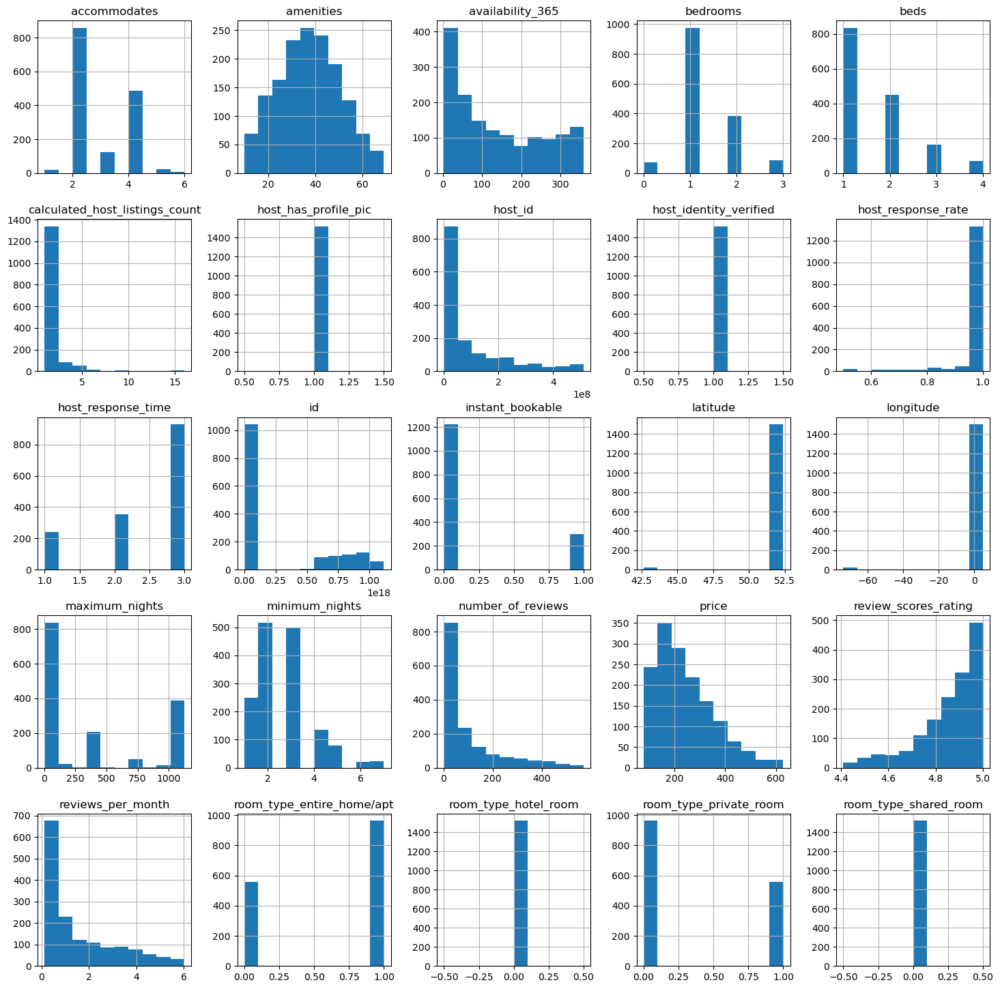

In [464]:
fig = plt.figure(figsize = (18, 18))
ax = fig.gca()
numeric_df.hist(ax=ax)
plt.show()

## VI. DATA REDUCTION (FEATURES SELECTION / FEATURES EXTRACTION)



#### All numeric features

In [468]:
numeric_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1521 entries, 0 to 1520
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   accommodates                    1521 non-null   int64  
 1   amenities                       1521 non-null   int64  
 2   availability_365                1521 non-null   int64  
 3   bedrooms                        1521 non-null   float64
 4   beds                            1521 non-null   float64
 5   calculated_host_listings_count  1521 non-null   int64  
 6   host_has_profile_pic            1521 non-null   int64  
 7   host_id                         1521 non-null   int64  
 8   host_identity_verified          1521 non-null   int64  
 9   host_response_rate              1521 non-null   float64
 10  host_response_time              1521 non-null   int64  
 11  id                              1521 non-null   int64  
 12  instant_bookable                15

In [470]:
numeric_df.describe()

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_id,host_identity_verified,host_response_rate,...,maximum_nights,minimum_nights,number_of_reviews,price,review_scores_rating,reviews_per_month,room_type_entire_home/apt,room_type_hotel_room,room_type_private_room,room_type_shared_room
count,1521.000000,1521.000000,1521.000000,1521.000000,1521.000000,1521.000000,1521.0,1.521000e+03,1521.0,1521.000000,...,1521.000000,1521.000000,1521.000000,1521.000000,1521.000000,1521.000000,1521.000000,1521.0,1521.000000,1521.0
mean,2.775805,37.462196,136.739645,1.322156,1.652202,1.594346,1.0,9.711862e+07,1.0,0.969770,...,385.094017,2.624589,99.621959,242.501644,4.862143,1.597048,0.633136,0.0,0.366864,0.0
std,1.000838,13.116885,113.230863,0.655013,0.849541,1.670706,0.0,1.256403e+08,0.0,0.092326,...,467.671485,1.231345,124.966205,114.850390,0.134522,1.512564,0.482107,0.0,0.482107,0.0
min,1.000000,10.000000,3.000000,0.000000,1.000000,1.000000,1.0,1.011032e+06,1.0,0.500000,...,4.000000,1.000000,2.000000,78.000000,4.410000,0.140000,0.000000,0.0,0.000000,0.0
25%,2.000000,28.000000,34.000000,1.000000,1.000000,1.000000,1.0,1.081168e+07,1.0,1.000000,...,21.000000,2.000000,13.000000,155.000000,4.800000,0.440000,0.000000,0.0,0.000000,0.0
50%,2.000000,37.000000,105.000000,1.000000,1.000000,1.000000,1.0,3.757468e+07,1.0,1.000000,...,40.000000,2.000000,41.000000,215.000000,4.890000,0.860000,1.000000,0.0,0.000000,0.0
75%,4.000000,47.000000,239.000000,2.000000,2.000000,1.000000,1.0,1.416586e+08,1.0,1.000000,...,1124.000000,3.000000,139.000000,300.000000,4.970000,2.510000,1.000000,0.0,1.000000,0.0
max,6.000000,69.000000,359.000000,3.000000,4.000000,16.000000,1.0,5.116963e+08,1.0,1.000000,...,1125.000000,7.000000,570.000000,629.000000,5.000000,6.020000,1.000000,0.0,1.000000,0.0


#### Get only useful numeric features

In [473]:
test_df = numeric_df.drop(labels = ['host_id', 'id'], axis = 1)
test_df

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_has_profile_pic,host_identity_verified,host_response_rate,host_response_time,...,maximum_nights,minimum_nights,number_of_reviews,price,review_scores_rating,reviews_per_month,room_type_entire_home/apt,room_type_hotel_room,room_type_private_room,room_type_shared_room
0,2,28,134,0.0,1.0,1,1,1,1.00,3,...,1125,1,287,78.0,4.67,4.88,1,0,0,0
1,5,38,195,2.0,2.0,1,1,1,1.00,3,...,14,1,228,274.0,4.94,4.03,1,0,0,0
2,4,40,3,1.0,2.0,1,1,1,1.00,3,...,800,1,167,118.0,4.99,2.95,1,0,0,0
3,3,46,355,1.0,2.0,16,1,1,0.99,3,...,1125,1,74,115.0,4.86,1.87,1,0,0,0
4,2,49,308,1.0,1.0,16,1,1,0.99,3,...,1125,1,45,120.0,4.62,1.19,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1516,2,34,284,1.0,1.0,1,1,1,1.00,3,...,60,2,178,154.0,4.96,2.70,0,0,1,0
1517,2,31,157,1.0,1.0,1,1,1,1.00,2,...,5,2,262,150.0,4.92,3.72,0,0,1,0
1518,2,25,315,1.0,1.0,2,1,1,1.00,3,...,365,1,330,115.0,4.58,4.51,0,0,1,0
1519,2,53,334,1.0,2.0,1,1,1,0.71,1,...,30,1,80,406.0,4.83,0.67,1,0,0,0


In [475]:
test_df = test_df.drop(labels = ['host_has_profile_pic', 'room_type_hotel_room', 'room_type_shared_room'], axis = 1)

In [477]:
# test_df = test_df.drop(labels = ['host_has_profile_pic', 'host_identity_verified', 'host_response_rate', 'host_response_time', 'room_type_entire_home/apt', 'room_type_hotel_room', 'room_type_private_room', 'room_type_shared_room'], axis = 1)

In [479]:
test_df = test_df.reset_index(drop = True)

In [481]:
test_df.head(3)

,accommodates,amenities,availability_365,bedrooms,beds,calculated_host_listings_count,host_identity_verified,host_response_rate,host_response_time,instant_bookable,latitude,longitude,maximum_nights,minimum_nights,number_of_reviews,price,review_scores_rating,reviews_per_month,room_type_entire_home/apt,room_type_private_room
0,2,28,134,0.0,1.0,1,1,1.0,3,0,42.65547,-73.76510,1125,1,287,78.0,4.67,4.88,1,0
1,5,38,195,2.0,2.0,1,1,1.0,3,0,42.66091,-73.74285,14,1,228,274.0,4.94,4.03,1,0
2,4,40,3,1.0,2.0,1,1,1.0,3,0,42.67773,-73.73899,800,1,167,118.0,4.99,2.95,1,0


In [483]:
numeric_df = test_df

In [485]:
numeric_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1521 entries, 0 to 1520
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   accommodates                    1521 non-null   int64  
 1   amenities                       1521 non-null   int64  
 2   availability_365                1521 non-null   int64  
 3   bedrooms                        1521 non-null   float64
 4   beds                            1521 non-null   float64
 5   calculated_host_listings_count  1521 non-null   int64  
 6   host_identity_verified          1521 non-null   int64  
 7   host_response_rate              1521 non-null   float64
 8   host_response_time              1521 non-null   int64  
 9   instant_bookable                1521 non-null   int64  
 10  latitude                        1521 non-null   float64
 11  longitude                       1521 non-null   float64
 12  maximum_nights                  15

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/2065293290.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  numeric_df.hist(ax=ax)


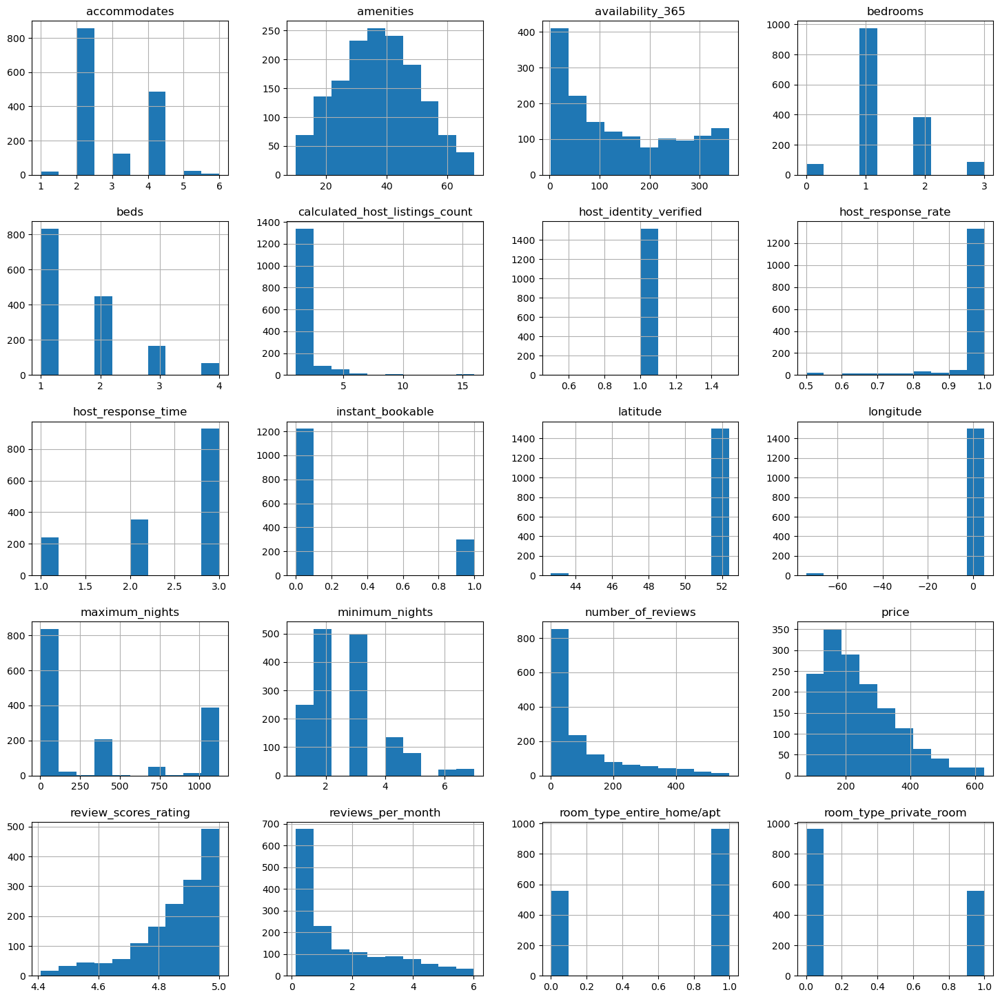

In [487]:
fig = plt.figure(figsize = (18, 18))
ax = fig.gca()
numeric_df.hist(ax=ax)
plt.show()

## VIII. MODELS BUILDING PREPARATION


### 1.	Separate the target variable in the training set & test set

In [491]:
X = numeric_df.drop(["price"], axis = 1)

y = numeric_df["price"]

feature_names = X.columns

### 2. Create training set and test set

In [494]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42, test_size = 0.3)

In [496]:
X_train.reset_index(drop = True, inplace = True)
y_train.reset_index(drop = True, inplace = True)
X_test.reset_index(drop = True, inplace = True)
y_test.reset_index(drop = True, inplace = True)

In [498]:
display(X_train.shape)
display(y_train.shape)
display(X_test.shape)
display(y_test.shape)

(1064, 19)

(1064,)

(457, 19)

(457,)

### 3.	Feature Transformation 

#### a.	Standard Scaler

In [502]:
# sc = StandardScaler()
# X_train = sc.fit_transform(X_train)
# X_test  = sc.transform(X_test)

#### b.	Robust Scaler

In [505]:
rc = RobustScaler()
X_train = rc.fit_transform(X_train)
X_test  = rc.transform(X_test)

## IX. MODELS BUILDING

### 1.	Linear Regression



#### a. Build

In [510]:
# train RF regressor model
LinearRegression_model = LinearRegression()
LinearRegression_model.fit(X_train, y_train)

LinearRegression()

Calculate Model coefficients:

In [513]:
print("Model coefficients:\n")
for i in range(X.shape[1]):
    print(X.columns[i], "=", LinearRegression_model.coef_[i].round(4))

Model coefficients:

accommodates = 67.0189
amenities = 8.4974
availability_365 = 21.7837
bedrooms = 35.2692
beds = -1.867
calculated_host_listings_count = 0.1512
host_identity_verified = -0.0
host_response_rate = 16.6234
host_response_time = 1.597
instant_bookable = 4.3821
latitude = -1.6287
longitude = 0.4465
maximum_nights = 14.3963
minimum_nights = -6.7802
number_of_reviews = -12.813
review_scores_rating = 16.6002
reviews_per_month = -12.1462
room_type_entire_home/apt = 34.1093
room_type_private_room = -34.1093


#### b.	Predict y_train_predict

In [516]:
y_train_predict = LinearRegression_model.predict(X_train)

Calculate MAE, MSE, RMSE, R2


In [519]:
print(f'MAE: {mean_absolute_error(y_train, y_train_predict)}')
print(f'MSE: {mean_squared_error(y_train, y_train_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_train, y_train_predict))}')
print(f'R^2: {r2_score(y_train, y_train_predict)}')

MAE: 61.04433228602932
MSE: 6541.690978773551
RMSE: 80.8807206865366
R^2: 0.5055799764813887


#### c. Predict y_test_predict

In [522]:
y_test_predict = LinearRegression_model.predict(X_test)

Calculate MAE, MSE, RMSE, R2


In [525]:
print(f'MAE: {mean_absolute_error(y_test, y_test_predict)}')
print(f'MSE: {mean_squared_error(y_test, y_test_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_test_predict))}')
print(f'R^2: {r2_score(y_test, y_test_predict)}')

MAE: 62.95925297011174
MSE: 6750.641068652879
RMSE: 82.1622849527256
R^2: 0.48321806889662866


In [527]:
range(len(y_test))

range(0, 457)

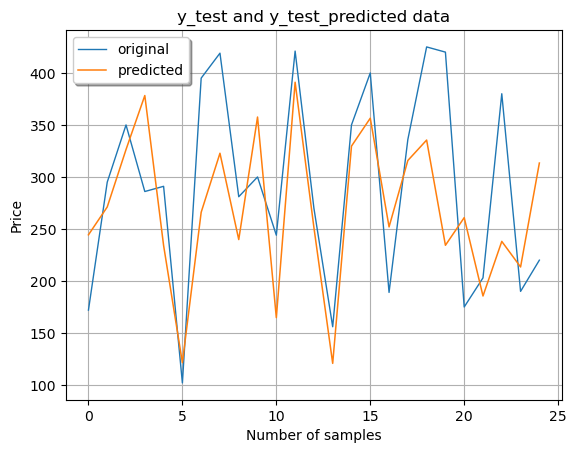

In [529]:
i = 25
x_ax = range(0, i)
plt.plot(x_ax, y_test[0:i], linewidth = 1, label = "original")
plt.plot(x_ax, y_test_predict[0:i], linewidth = 1.1, label = "predicted")
plt.title("y_test and y_test_predicted data")
plt.xlabel('Number of samples')
plt.ylabel('Price')
plt.legend(loc = 'best',fancybox = True, shadow = True)
plt.grid(True)
plt.show() 

#### d. Explainable AI (XAI)

##### i.	Local Interpretation

##### LIME

In [534]:
# Instantiating the explainer object by passing in the training set, and the extracted features
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names = feature_names, verbose = True, mode = 'regression')

In [536]:
# Index corresponding to the test vector
i = 0

# Number denoting the top features
k = 5

# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], LinearRegression_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 270.25841108465823
Prediction_local [202.20576866]
Right: 244.36317995594575


In [538]:
# Index corresponding to the test vector
i = 1

# Number denoting the top features
k = 5

# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], LinearRegression_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 272.9216636514829
Prediction_local [220.12327505]
Right: 271.1471140687646


#### SHAP

In [547]:
# Create object that can calculate shap values
explainer = shap.LinearExplainer(LinearRegression_model, X_train, feature_perturbation="interventional")
# Calculate Shap values
shap_values = explainer.shap_values(X_train)

/opt/anaconda3/lib/python3.12/site-packages/shap/explainers/_linear.py:95: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


In [549]:
shap.initjs()
i = 18
shap.force_plot(explainer.expected_value, shap_values[i], X_test[i], feature_names = feature_names)

In [551]:
# visualize the first 5 predictions explanations with a dark red dark blue color map.
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0:5,:], X_test[0:5,:], plot_cmap = "DrDb", feature_names = feature_names)

In [86]:
# shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names = list(feature_names))

##### ii. Global Interpretation

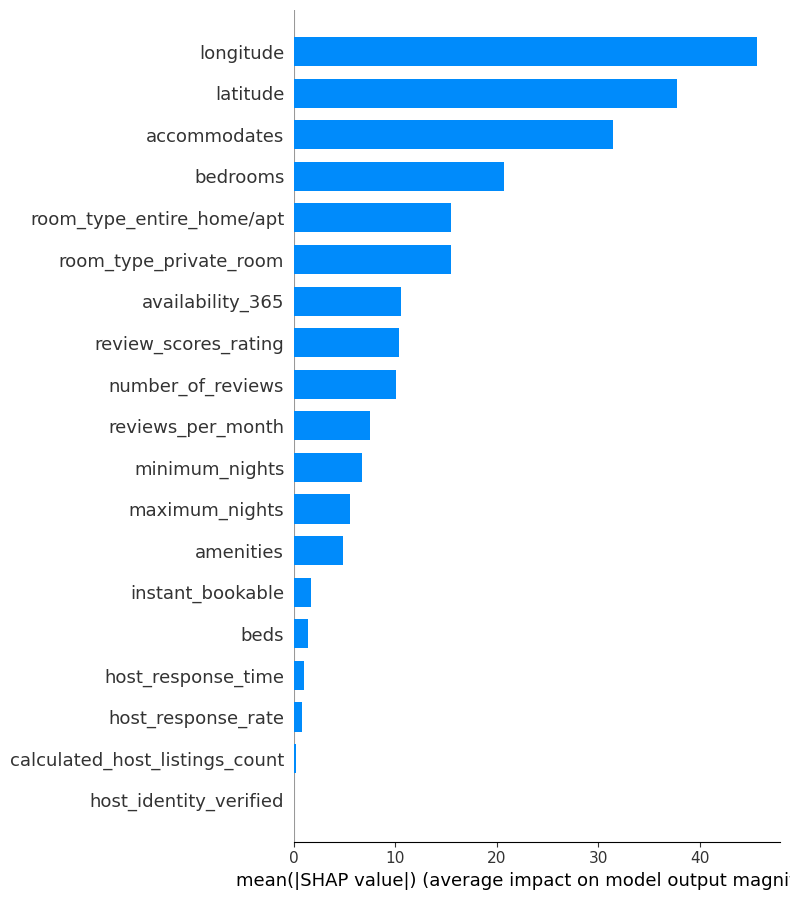

In [553]:
shap.summary_plot(shap_values, X_train, feature_names = feature_names, plot_type="bar")

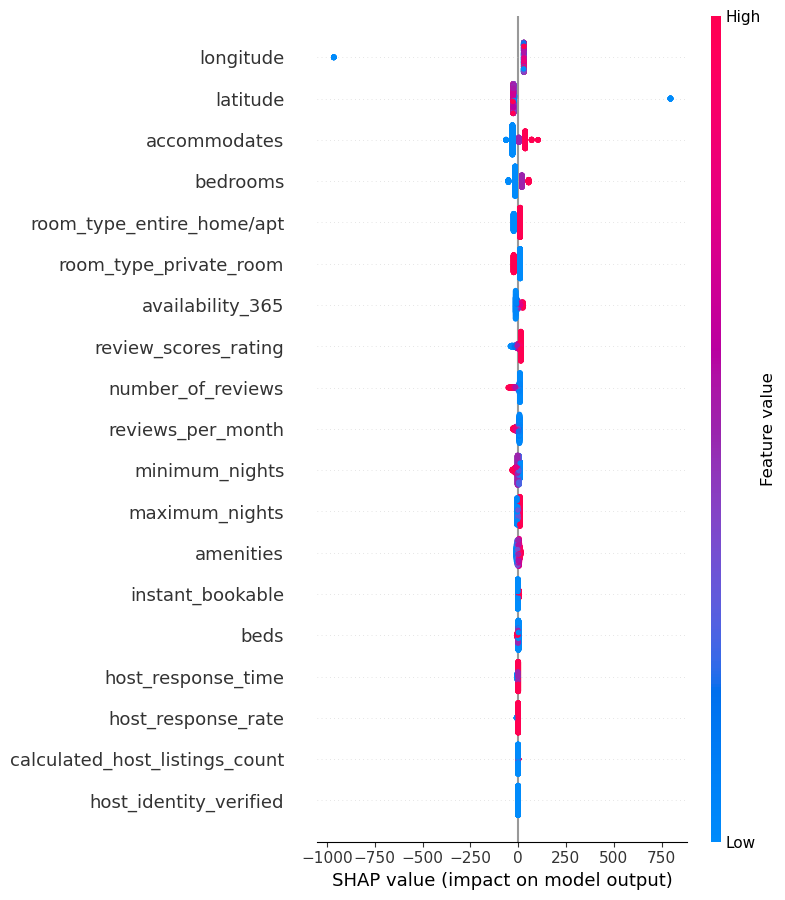

In [555]:
shap.summary_plot(shap_values, X_train, feature_names = feature_names)

##### PDP

In [557]:
# shap.dependence_plot(5, shap_values, X_train, feature_names = feature_names)

### 2.	Decision Tree



#### a. Build

In [561]:
# train RF regressor model
DecisionTree_model = DecisionTreeRegressor(criterion = "friedman_mse", max_depth = 10, random_state = 42)
DecisionTree_model.fit(X_train, y_train)

DecisionTreeRegressor(criterion='friedman_mse', max_depth=10, random_state=42)

#### b.	Predict y_train_predict

In [564]:
y_train_predict = DecisionTree_model.predict(X_train)

Calculate MAE, MSE, RMSE, R2


In [567]:
print(f'MAE: {mean_absolute_error(y_train, y_train_predict)}')
print(f'MSE: {mean_squared_error(y_train, y_train_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_train, y_train_predict))}')
print(f'R^2: {r2_score(y_train, y_train_predict)}')

MAE: 24.004673602245752
MSE: 1824.3037920891197
RMSE: 42.71186945205185
R^2: 0.8621193928731103


#### c. Predict y_test_predict

In [570]:
y_test_predict = DecisionTree_model.predict(X_test)

Calculate MAE, MSE, RMSE, R2


In [573]:
print(f'MAE: {mean_absolute_error(y_test, y_test_predict)}')
print(f'MSE: {mean_squared_error(y_test, y_test_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_test_predict))}')
print(f'R^2: {r2_score(y_test, y_test_predict)}')

MAE: 73.30496797520225
MSE: 9771.287408537437
RMSE: 98.84982250129454
R^2: 0.2519784824883736


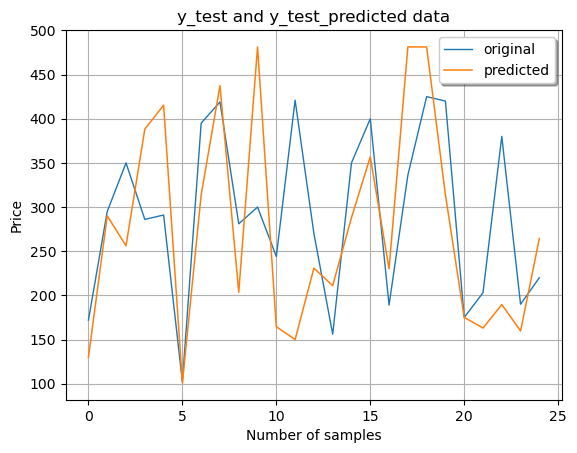

In [575]:
i = 25
x_ax = range(0, i)
plt.plot(x_ax, y_test[0:i], linewidth = 1, label = "original")
plt.plot(x_ax, y_test_predict[0:i], linewidth = 1.1, label = "predicted")
plt.title("y_test and y_test_predicted data")
plt.xlabel('Number of samples')
plt.ylabel('Price')
plt.legend(loc = 'best',fancybox = True, shadow = True)
plt.grid(True)
plt.show() 

#### d. Explainable AI (XAI)

##### i.	Local Interpretation

##### LIME

In [580]:
# Instantiating the explainer object by passing in the training set, and the extracted features
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names = feature_names, verbose = True, mode = 'regression')

In [582]:
# Index corresponding to the test vector
i = 0

# Number denoting the top features
k = 5

# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], DecisionTree_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 311.32659152717713
Prediction_local [130.38837626]
Right: 130.0


In [584]:
# Index corresponding to the test vector
i = 1

# Number denoting the top features
k = 5

# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], DecisionTree_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 265.4402991859963
Prediction_local [249.79380085]
Right: 290.0


#### SHAP

In [587]:
# # Create object that can calculate shap values
# explainer = shap.TreeExplainer(DecisionTree_model)
# # Calculate Shap values
# shap_values = explainer.shap_values(X_train)

In [589]:
# shap.initjs()
# i = 18
# shap.force_plot(explainer.expected_value, shap_values[i], X_test[i], feature_names = feature_names)

In [591]:
# # visualize the first 5 predictions explanations with a dark red dark blue color map.
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[0:5,:], X_test[0:5,:], plot_cmap = "DrDb", feature_names = feature_names)

In [593]:
# shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names = list(feature_names))

##### ii. Global Interpretation

In [596]:
# shap.summary_plot(shap_values, X_train, feature_names = feature_names, plot_type="bar")

In [598]:
# shap.summary_plot(shap_values, X_train, feature_names = feature_names)

##### PDP

In [601]:
# shap.dependence_plot(5, shap_values, X_train, feature_names = feature_names)

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/4107698528.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = "Feature importance", y = "Column", data = features_importance, palette = "Set2", orient = 'h');


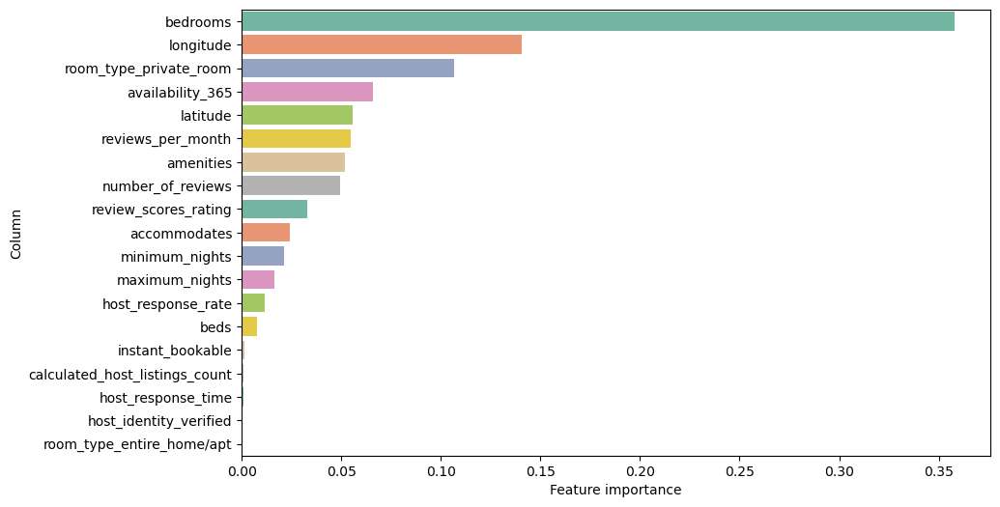

In [603]:

features_importance = pd.DataFrame(
    {
        'Column': feature_names,
        'Feature importance': DecisionTree_model.feature_importances_
    }
).sort_values('Feature importance', ascending = False)

fig, ax = plt.subplots(figsize = (10, 6))
ax = sns.barplot(x = "Feature importance", y = "Column", data = features_importance, palette = "Set2", orient = 'h');

### 3.	Random Forest



#### a. Build

In [607]:
# train RF regressor model
RandomForest_model = RandomForestRegressor(n_estimators = 100, random_state = 42)
RandomForest_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

#### b.	Predict y_train_predict

In [609]:
y_train_predict = RandomForest_model.predict(X_train)

Calculate MAE, MSE, RMSE, R2


In [613]:
print(f'MAE: {mean_absolute_error(y_train, y_train_predict)}')
print(f'MSE: {mean_squared_error(y_train, y_train_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_train, y_train_predict))}')
print(f'R^2: {r2_score(y_train, y_train_predict)}')

MAE: 20.044774436090226
MSE: 758.2586513157895
RMSE: 27.536496714647445
R^2: 0.9426909248032028


#### c. Predict y_test_predict

In [616]:
y_test_predict = RandomForest_model.predict(X_test)

Calculate MAE, MSE, RMSE, R2


In [619]:
print(f'MAE: {mean_absolute_error(y_test, y_test_predict)}')
print(f'MSE: {mean_squared_error(y_test, y_test_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_test_predict))}')
print(f'R^2: {r2_score(y_test, y_test_predict)}')

MAE: 55.27967177242888
MSE: 5520.457449234135
RMSE: 74.2997809501087
R^2: 0.5773923347166624


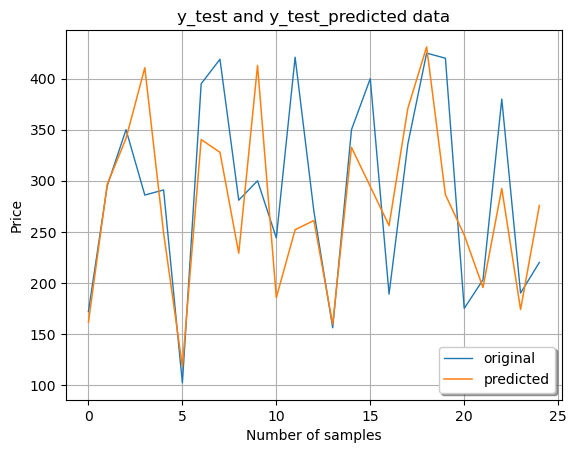

In [621]:
i = 25
x_ax = range(0, i)
plt.plot(x_ax, y_test[0:i], linewidth = 1, label = "original")
plt.plot(x_ax, y_test_predict[0:i], linewidth = 1.1, label = "predicted")
plt.title("y_test and y_test_predicted data")
plt.xlabel('Number of samples')
plt.ylabel('Price')
plt.legend(loc = 'best',fancybox = True, shadow = True)
plt.grid(True)
plt.show() 

#### d. Explainable AI (XAI)

##### i.	Local Interpretation

##### LIME

In [626]:
# Instantiating the explainer object by passing in the training set, and the extracted features
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names = feature_names, verbose = True, mode = 'regression')

In [628]:
# Index corresponding to the test vector
i = 0

# Number denoting the top features
k = 5

# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], RandomForest_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 346.9502293797161
Prediction_local [115.46951107]
Right: 161.54


In [630]:
# Index corresponding to the test vector
i = 1

# Number denoting the top features
k = 5

# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], RandomForest_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 274.0014019611092
Prediction_local [282.72297112]
Right: 296.47


#### SHAP

In [633]:
# # Create object that can calculate shap values
# explainer = shap.TreeExplainer(RandomForest_model)
# # Calculate Shap values
# shap_values = explainer.shap_values(X_train)

In [635]:
# shap.initjs()
# i = 18
# shap.force_plot(explainer.expected_value, shap_values[i], X_test[i], feature_names = feature_names)

In [637]:
# # visualize the first 5 predictions explanations with a dark red dark blue color map.
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[0:5,:], X_test[0:5,:], plot_cmap = "DrDb", feature_names = feature_names)

In [639]:
# shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names = list(feature_names))

##### ii. Global Interpretation

In [642]:
# shap.summary_plot(shap_values, X_train, feature_names = feature_names, plot_type="bar")

In [644]:
# shap.summary_plot(shap_values, X_train, feature_names = feature_names)

##### PDP

In [647]:
# shap.dependence_plot(5, shap_values, X_train, feature_names = feature_names)

##### Feature Importance

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/3910792024.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = "Feature importance", y = "Column", data = features_importance, palette = "Set2", orient = 'h');


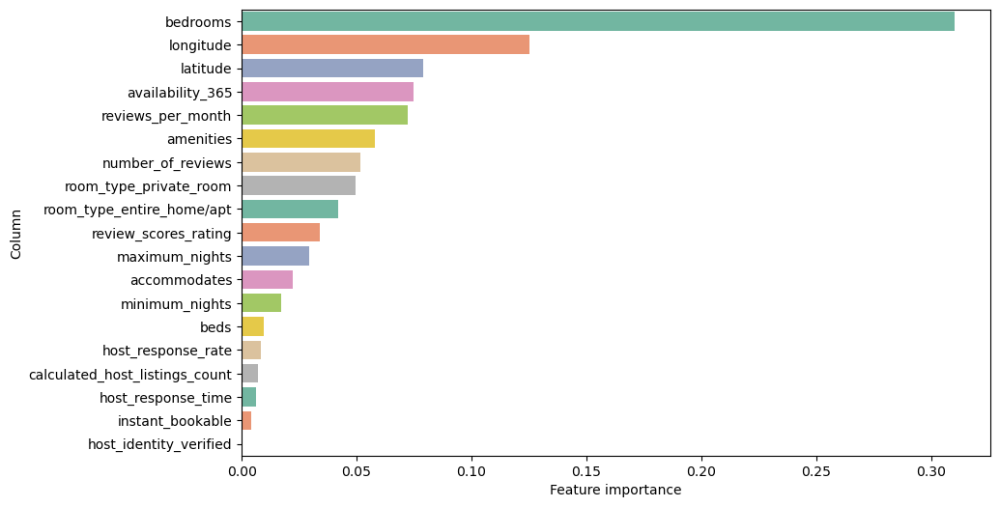

In [650]:

features_importance = pd.DataFrame(
    {
        'Column': feature_names,
        'Feature importance': RandomForest_model.feature_importances_
    }
).sort_values('Feature importance', ascending = False)

fig, ax = plt.subplots(figsize = (10, 6))
ax = sns.barplot(x = "Feature importance", y = "Column", data = features_importance, palette = "Set2", orient = 'h');

### 4. XGBoost


#### a. Build

In [654]:
#train XGBoost model
XGB_model = XGBRegressor(n_estimators = 100, learning_rate = 0.08, gamma = 0, subsample = 0.75, colsample_bytree = 1, max_depth = 10)

XGB_model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
             device=None, early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.08, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, random_state=None, ...)

#### b.	Predict y_train_predict

In [657]:
y_train_predict = XGB_model.predict(X_train)

Calculate MAE, MSE, RMSE, R2


In [660]:
print(f'MAE: {mean_absolute_error(y_train, y_train_predict)}')
print(f'MSE: {mean_squared_error(y_train, y_train_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_train, y_train_predict))}')
print(f'R^2: {r2_score(y_train, y_train_predict)}')

MAE: 3.01033656041425
MSE: 20.456556850208877
RMSE: 4.522892531357436
R^2: 0.9984538964998793


#### c. Predict y_test_predict

In [663]:
y_test_predict = XGB_model.predict(X_test)

Calculate MAE, MSE, RMSE, R2


In [666]:
print(f'MAE: {mean_absolute_error(y_test, y_test_predict)}')
print(f'MSE: {mean_squared_error(y_test, y_test_predict)}')
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_test_predict))}')
print(f'R^2: {r2_score(y_test, y_test_predict)}')

MAE: 55.383769095856984
MSE: 5526.254865432715
RMSE: 74.33878439571578
R^2: 0.5769485250239172


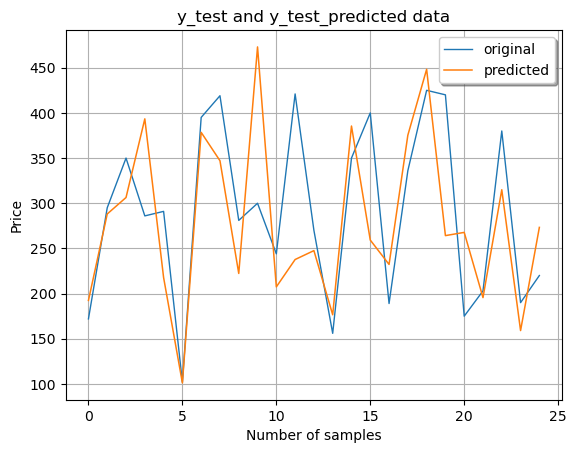

In [668]:
i = 25
x_ax = range(0, i)
plt.plot(x_ax, y_test[0:i], linewidth = 1, label = "original")
plt.plot(x_ax, y_test_predict[0:i], linewidth = 1.1, label = "predicted")
plt.title("y_test and y_test_predicted data")
plt.xlabel('Number of samples')
plt.ylabel('Price')
plt.legend(loc = 'best',fancybox = True, shadow = True)
plt.grid(True)
plt.show() 

#### d. Explainable AI (XAI)

##### i.	Local Interpretation

##### LIME

In [673]:
# Instantiating the explainer object by passing in the training set, and the extracted features
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names = feature_names, verbose = True, mode = 'regression')

In [675]:
# Index corresponding to the test vector
i = 0

# Number denoting the top features
k = 5



# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], XGB_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 271.8670527423199
Prediction_local [129.10856447]
Right: 192.4411


In [677]:
# Index corresponding to the test vector
i = 1

# Number denoting the top features
k = 5



# Calling the explain_instance method by passing in the:
# 1) ith test vector
# 2) prediction function used by our prediction model('reg' in this case)
# 3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance(X_test[i], XGB_model.predict, num_features=k, num_samples = 5000)

# Finally visualizing the explanations
exp_lime.show_in_notebook()


Intercept 284.2707202475153
Prediction_local [201.26916818]
Right: 288.13358


#### SHAP

In [680]:
# # Create object that can calculate shap values
# explainer = shap.TreeExplainer(XGB_model)
# # Calculate Shap values
# shap_values = explainer.shap_values(X_train)

In [682]:
# shap.initjs()
# i = 18
# shap.force_plot(explainer.expected_value, shap_values[i], X_test[i], feature_names = feature_names)

In [684]:
# # visualize the first 5 predictions explanations with a dark red dark blue color map.
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[0:5,:], X_test[0:5,:], plot_cmap = "DrDb", feature_names = feature_names)

In [686]:
# shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names = list(feature_names))

##### ii. Global Interpretation

In [689]:
# shap.summary_plot(shap_values, X_train, feature_names = feature_names, plot_type="bar")

In [691]:
# shap.summary_plot(shap_values, X_train, feature_names = feature_names)

##### PDP

In [694]:
# shap.dependence_plot(5, shap_values, X_train, feature_names = feature_names)

##### Feature Importance

/var/folders/f6/s8p4_84101l8gy61qszps_c40000gn/T/ipykernel_29313/1957661633.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = "Feature importance", y = "Column", data = features_importance, palette = "Set2", orient = 'h');


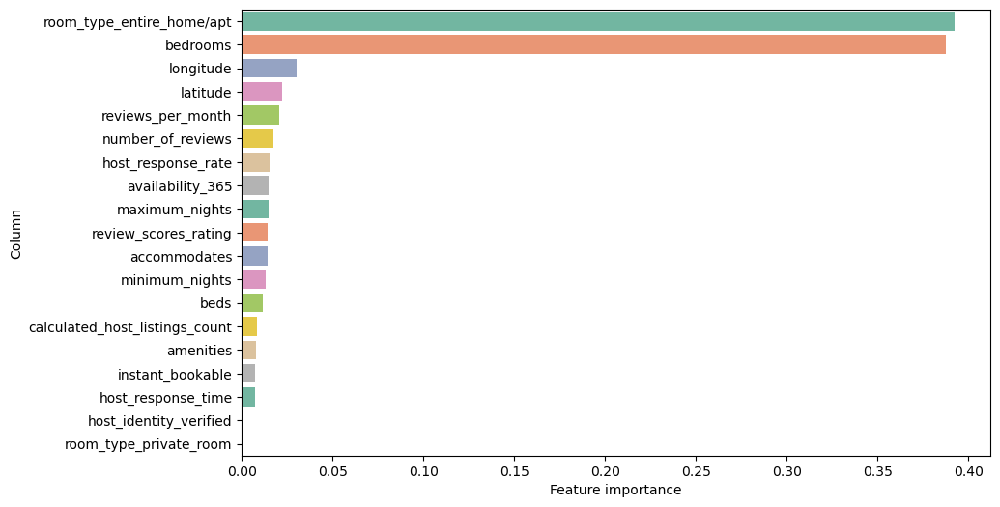

In [697]:

features_importance = pd.DataFrame(
    {
        'Column': feature_names,
        'Feature importance': XGB_model.feature_importances_
    }
).sort_values('Feature importance', ascending = False)

fig, ax = plt.subplots(figsize = (10, 6))
ax = sns.barplot(x = "Feature importance", y = "Column", data = features_importance, palette = "Set2", orient = 'h');

In [699]:
# %%shell
# jupyter nbconvert --to html /content/Data_Science-Framework.ipynb